# Image Classification: American Hand Sign for A, B, C, D, and E Using CNN Model (37K imamges)

Name: Mathias Yeremia Aryadi

Email: mathiasyeremia123@gmail.com

Dicoding ID: mathiasy

# Import Library

In [14]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.2 MB/s eta 0:00:00:00:01m0:01m
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.1
    Uninstalling tensorflow-2.17.1:
      Successfully uninstalled tensorflow-2.17.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.
pandas-gbq 0.25.0 requires google-api-core<3.0.0dev,>=2.10.2, but you have google-api-core 1.34.1 which is incompatible.
plotnine 0.14.4 requires

In [47]:
import pandas as pd
import os
import shutil
import numpy as np
import pathlib
import matplotlib.pyplot as plt

from PIL import Image

import plotly.subplots as sp
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split

import tensorflow as tf
import keras
from keras.utils import image_dataset_from_directory
from keras.layers import Input, Rescaling, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import confusion_matrix, classification_report
import kagglehub
from IPython.display import display
import ipywidgets as widgets
from io import BytesIO 

# Load Dataset: Kaggle

In [19]:
dataset_path = kagglehub.dataset_download("mathiasyeremia/hand-sign-datasets")
print("Path to dataset files:", dataset_path)
dataset_path = os.path.join(dataset_path, "hand_sign")

Path to dataset files: /kaggle/input/hand-sign-datasets


# Load Dataset: Google Collab

In [20]:
# !kaggle datasets download mathiasyeremia/hand-sign-datasets
# !unzip hand-sign-datasets.zip

In [21]:
# dataset_path = "hand_sign"

# Image Directory to Dataframe

We extract our image datasets into dataframe contains full page of the images, file names, image sizes, and labels

In [22]:
%%time

dataset_path = '/kaggle/input/hand-sign-datasets/hand_sign'

data = []

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    
    if os.path.isdir(label_path):
        for file_name in os.listdir(label_path):
            file_path = os.path.join(label_path, file_name)

            img = Image.open(file_path)
            width, height = img.size
            image_size = f"{width} x {height}"

            data.append([file_path, file_name, image_size, label])

df = pd.DataFrame(data, columns=["full_path", "file_name", "image_size", "label"])

CPU times: user 6.48 s, sys: 5.33 s, total: 11.8 s
Wall time: 7min 41s


In [23]:
df.head()

,full_path,file_name,image_size,label
0,/kaggle/input/hand-sign-datasets/hand_sign/B/2...,26060_B.jpg,28 x 28,B
1,/kaggle/input/hand-sign-datasets/hand_sign/B/B...,B634.jpg,640 x 480,B
2,/kaggle/input/hand-sign-datasets/hand_sign/B/B...,B1044.jpg,640 x 480,B
3,/kaggle/input/hand-sign-datasets/hand_sign/B/B...,B2881.jpg,400 x 400,B
4,/kaggle/input/hand-sign-datasets/hand_sign/B/B...,B1109.jpg,640 x 480,B


# Exploratory Image Data

We explore how many images that we have gathered, how many labels we have, and how many image variants we have. Then we inspect one sample on each labels.

In [24]:
image_count = len(df['file_name'])
label_count = df['label'].nunique()
image_size_count = df['image_size'].nunique()
image_size_variants = df['image_size'].unique()

print(f"Total all images: {image_count}")
print(f"Total labels: {label_count}")
print(f"Total image size variants: {image_size_count}")
print(f"Image size variants: {image_size_variants}")

Total all images: 37363
Total labels: 5
Total image size variants: 4
Image size variants: ['28 x 28' '640 x 480' '400 x 400' '300 x 300']


In [25]:
df_sample_images = df.groupby('label').first().reset_index()

fig = sp.make_subplots(
    rows=1, 
    cols=len(df_sample_images),
    subplot_titles=df_sample_images["label"],
)

for i, row in enumerate(df_sample_images.itertuples(), start=1):
    img = Image.open(row.full_path)
    fig.add_trace(go.Image(z=img), row=1, col=i)

fig.update_layout(
    title="Sample Images from Each Label",
    showlegend=False,
    height=500
)

fig.show()

In [29]:
df_image_size = df.groupby('image_size').count().reset_index()[['image_size', 'file_name']]

fig = px.bar(
    df_image_size,
    x='image_size',
    y='file_name',
    color='image_size',
    title='Image Size Variants'
)
fig.show()

In [30]:
df_labels = df.groupby('label').count().reset_index()[['file_name', 'label']]

fig = px.bar(
    df_labels,
    x='label',
    y='file_name',
    color='label',
    title='Class Distribution'
)
fig.show()

# Dataset Splitting

We split our image datasets into training (0.8 rate), validation (0.1 rate), and testing (0.1 rate). Then we see the splitting distribution.

In [31]:
df_train, df_temp = train_test_split(df, test_size=0.2, stratify=df['label'], shuffle=True, random_state=42)
df_test, df_validation = train_test_split(df_temp, test_size=0.5, stratify=df_temp['label'], shuffle=True, random_state=42)

In [32]:
train_images = len(df_train['file_name'])
validation_images = len(df_validation['file_name'])
test_images = len(df_test['file_name'])

print(f'Total image in training sets: {train_images}')
print(f'Total image in validation sets: {validation_images}')
print(f'Total image in test sets: {test_images}')

Total image in training sets: 29890
Total image in validation sets: 3737
Total image in test sets: 3736


In [33]:
df_distribution = pd.DataFrame({
    "set": ["train", "validation", "test"], 
    "count": [len(df_train), len(df_validation), len(df_test)]
})

fig = px.bar(
    df_distribution,
    x='set',
    y='count',
    title='Train, Validation, & Validation Distribution'
)
fig.show()

# Pre-Processing & Resize

We transform our split image datasets into input data that acceptable for our CNN model and resize our image.

In [34]:
%%time 

generator_dataset_path = '/kaggle/working/hand-sign-generator'

os.makedirs(generator_dataset_path, exist_ok=True)

train_path = os.path.join(generator_dataset_path, 'train')
validation_path = os.path.join(generator_dataset_path, 'validation')
test_path = os.path.join(generator_dataset_path, 'test')

for label in df['label'].unique():
    os.makedirs(os.path.join(train_path, label), exist_ok=True)
    os.makedirs(os.path.join(validation_path, label), exist_ok=True)
    os.makedirs(os.path.join(test_path, label), exist_ok=True)

for _, row in df_train.iterrows():
    shutil.copy(row.full_path, os.path.join(train_path, row.label))

for _, row in df_validation.iterrows():
    shutil.copy(row.full_path, os.path.join(validation_path, row.label))

for _, row in df_test.iterrows():
    shutil.copy(row.full_path, os.path.join(test_path, row.label))

CPU times: user 7.37 s, sys: 6.43 s, total: 13.8 s
Wall time: 2min 6s


In [36]:
%%time

train_datasets = image_dataset_from_directory(
    directory=train_path,
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=16,
    image_size=(256, 256),
    seed=42,
)

validation_datasets = image_dataset_from_directory(
    directory=validation_path,
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=16,
    image_size=(256, 256),
    seed=42,
)

test_datasets = image_dataset_from_directory(
    directory=test_path,
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=16,
    image_size=(256, 256),
    seed=42,
)

Found 29890 files belonging to 5 classes.
Found 3737 files belonging to 5 classes.
Found 3736 files belonging to 5 classes.
CPU times: user 1.42 s, sys: 565 ms, total: 1.99 s
Wall time: 1.7 s


# Model Building

We build our CNN model that consisted of:

1. Conv2D Layer: 64 filters with 3x3 kernel
2. MaxPooling2D Layer: 2x2 pool size
3. Conv2D Layer: 64 filters with 3x3 kernel
4. MaxPooling2D Layer: 2x2 pool size
5. Conv2D Layer: 128 filters with 3x3 kernel
6. MaxPooling2D Layer: 2x2 pool size
7. Conv2D Layer: 128 filters with 3x3 kernel
8. MaxPooling2D Layer: 2x2 pool size
9. Conv2D Layer: 128 filters with 3x3 kernel
10. MaxPooling2D Layer: 2x2 pool size
11. Conv2D Layer: 512 filters with 3x3 kernel
12. MaxPooling2D Layer: 2x2 pool size
13. Dense Layer: 128 units
14. Dense Layer: 64 units

In [54]:
cnn_model = keras.Sequential()
cnn_model.add(Input(shape=(256, 256, 3)))
cnn_model.add(Rescaling(1./255))
cnn_model.add(Conv2D(64, (3, 3), padding="same", activation="relu"))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(BatchNormalization())
cnn_model.add(Conv2D(64, (3, 3), padding="same", activation="relu"))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(BatchNormalization())
cnn_model.add(Conv2D(128, (3, 3), padding="same", activation="relu"))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(BatchNormalization())
cnn_model.add(Conv2D(128, (3, 3), padding="same", activation="relu"))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(BatchNormalization())
cnn_model.add(Conv2D(512, (3, 3), padding="same", activation="relu"))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(BatchNormalization())
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu'))
cnn_model.add(Dropout(0.2))
cnn_model.add(Dense(64, activation='relu'))
cnn_model.add(Dropout(0.2))
cnn_model.add(Dense(5, activation='softmax'))

cnn_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)              │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 16, 16, 512)         │         590,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │       4,194,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │              

 Total params: 5,057,093 (19.29 MB)

 Trainable params: 5,055,301 (19.28 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [55]:
cnn_model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy"]
)

# Model Training

We train our CNN model with callback early stopping when the training and the validation accuracy has reached more than 95%.

In [56]:
class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') > 0.95 and logs.get('val_accuracy') > 0.95:
            print(f"\nTraining has stopped at {epoch} with training accuracy {logs.get('accuracy')} and validation accuracy {logs.get('val_accuracy')}")
            self.model.stop_training = True

my_callback = MyCallback()

cnn_history = cnn_model.fit(
    train_datasets,
    epochs=20,
    validation_data=validation_datasets,
    callbacks=[my_callback]
)

Epoch 1/20
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 112s 57ms/step - accuracy: 0.7259 - loss: 1.3608 - val_accuracy: 0.9773 - val_loss: 0.0739
Epoch 2/20
1868/1869 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9644 - loss: 0.1352
Training has stopped at 1 with training accuracy 0.9697892069816589 and validation accuracy 0.9975916743278503
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 102s 55ms/step - accuracy: 0.9644 - loss: 0.1352 - val_accuracy: 0.9976 - val_loss: 0.0094


# Model Evaluation

We evaluate our trained CNN model by comparing the training accuracy and validation accuracy and the training loss and validation loss. Then we calculate and visualize the confusion matrix.

In [57]:
cnn_acc = cnn_history.history['accuracy']
cnn_val_acc = cnn_history.history['val_accuracy']

df_cnn_acc = pd.DataFrame({
    'epochs': list(range(1, len(cnn_acc) + 1)),
    'accuracy': cnn_acc,
    'val_accuracy': cnn_val_acc
})

df_cnn_acc_melt = df_cnn_acc.melt(id_vars='epochs', value_vars=['accuracy', 'val_accuracy'], var_name='metric', value_name='value')

fig = px.line(df_cnn_acc_melt, x='epochs', y='value', color='metric', title='Training Accuracy vs Validation Accuracy', labels={'epochs': 'Epochs', 'value': 'Accuracy'})
fig.show()

In [58]:
cnn_loss = cnn_history.history['loss']
cnn_val_loss = cnn_history.history['val_loss']

df_cnn_loss = pd.DataFrame({
    'epochs': list(range(1, len(cnn_loss) + 1)),
    'loss': cnn_loss,
    'val_loss': cnn_val_loss
})

df_cnn_loss_melt = df_cnn_loss.melt(id_vars='epochs', value_vars=['loss', 'val_loss'], var_name='metric', value_name='value')

fig = px.line(df_cnn_loss_melt, x='epochs', y='value', color='metric', title='Training Loss vs Validation Loss', labels={'epochs': 'Epochs', 'value': 'Loss'})
fig.show()

In [59]:
score = cnn_model.evaluate(test_datasets, verbose=1)

print('Testing accuracy: ', score[1])
print('Testing loss: ', score[0])

234/234 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accuracy: 0.9973 - loss: 0.0104
Testing accuracy:  0.9975910186767578
Testing loss:  0.009736496955156326


In [60]:
%%time

class_names = test_datasets.class_names

y_true = []
y_pred = []

for x_test, y_test in test_datasets:
    preds = cnn_model.predict(x_test, verbose=0)
    y_true.extend(np.argmax(y_test.numpy(), axis=1))  
    y_pred.extend(np.argmax(preds, axis=1))


print('Example y prediction: ', y_pred[:5])
print('Example y true: ', y_true[:5])
print('Performance report: \n', classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)

fig = go.Figure(data=go.Heatmap(
    z=cm,
    x=class_names,
    y=class_names,
    colorscale='Blues',
    colorbar=dict(title='Count')
))

annotations = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        annotations.append(
            go.layout.Annotation(
                x=class_names[j],
                y=class_names[i],
                text=str(cm[i, j]),
                showarrow=False,
                font=dict(color='black' if cm[i, j] < cm.max() / 2 else 'white')
            )
        )

fig.update_layout(
    title='Confusion Matrix American Hand Sign Classification',
    xaxis=dict(title='Prediction'),
    yaxis=dict(title='Actual'),
    annotations=annotations
)

fig.show()

Example y prediction:  [4, 2, 4, 0, 1]
Example y true:  [4, 2, 4, 0, 1]
Performance report: 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00       719
           B       0.99      1.00      1.00       708
           C       1.00      1.00      1.00       721
           D       1.00      1.00      1.00       726
           E       1.00      1.00      1.00       862

    accuracy                           1.00      3736
   macro avg       1.00      1.00      1.00      3736
weighted avg       1.00      1.00      1.00      3736



CPU times: user 25.7 s, sys: 1.07 s, total: 26.8 s
Wall time: 18.5 s


# Save/Export Model

In [61]:
os.makedirs('/kaggle/working/saved_model', exist_ok=True)
os.makedirs('/kaggle/working/tfjs_model', exist_ok=True)
os.makedirs('/kaggle/working/tflite', exist_ok=True)

# TensorFlow Keras Save Model

In [62]:
cnn_model.export("/kaggle/working/saved_model", format="tf_saved_model")

Saved artifact at '/kaggle/working/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor_1016')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  140485940656640: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485940657344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922593904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922590032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922593200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922594432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922600416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922601120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922723920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140485922724448: TensorSpec(shape=(), dtype=tf.resource, name=None)


# TensorFlow JS Save Model

In [63]:
!tensorflowjs_converter --input_format tf_saved_model /kaggle/working/saved_model/ /kaggle/working/tfjs_model

2025-03-17 02:13:13.191691: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-17 02:13:13.211549: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-17 02:13:13.217741: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
I0000 00:00:1742177598.736109    2530 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1742177598.736461    2530 cuda_executor.cc:1015] succ

# TensorFlow Lite Save Model

In [64]:
tflite_converter = tf.lite.TFLiteConverter.from_saved_model("/kaggle/working/saved_model")
tflite_model = tflite_converter.convert()

tflite_model_file = pathlib.Path("/kaggle/working/tflite/model.tflite")
tflite_model_file.write_bytes(tflite_model)

with open('/kaggle/working/tflite/label.txt', 'a') as file:
    l1 = "A\n"
    l2 = "B\n"
    l3 = "C\n"
    l4 = "D\n"
    l4 = "E\n"

    file.writelines([l1, l2, l3, l4])

# Model Inference: TensorFlow Keras Model

We use 5 samples from our test sets that the model hasn't seen it and use the tensorflow keras saved model to infer the outcome. 

Then we also can use our own images from a photo and upload it on the file upload widget.

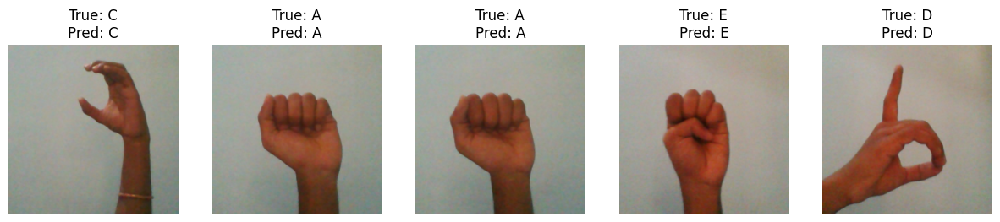

In [96]:
# Using Test Files
num_samples = 5
image_samples, label_samples = [], []
label_dict = {0: "A", 1: "B", 2: "C", 3: "D", 4: "E"}

for images, labels in test_datasets.take(1):  
    image_samples = images[:num_samples].numpy().astype("uint8") 
    label_samples = labels[:num_samples].numpy()
    break 

reloaded_artifact = tf.saved_model.load("/kaggle/working/saved_model")
predictions = reloaded_artifact.serve(tf.constant(image_samples, dtype=tf.float32))

predicted_classes = np.argmax(predictions, axis=1)

fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))

for i, ax in enumerate(axes):
    ax.imshow(image_samples[i])
    ax.axis("off")
    
    true_label = label_dict.get(np.argmax(label_samples[i]), "Unknown")
    predicted_label = label_dict.get(predicted_classes[i], "Unknown")
    
    ax.set_title(f"True: {true_label}\nPred: {predicted_label}")

plt.show()

In [86]:
# File Upload
upload = widgets.FileUpload()
display(upload)

FileUpload(value=(), description='Upload')

File 1270e6da-8676-4a01-9078-945e53d78318.jpeg inference has uploaded successfully.
Sample image size: (1, 256, 256, 3)


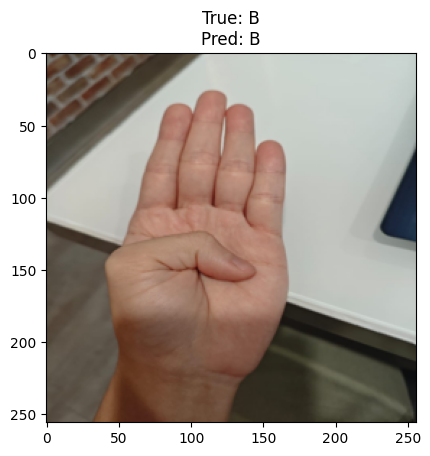

In [99]:
label_dict = {0: "A", 1: "B", 2: "C", 3: "D", 4: "E"}

uploaded_file = upload.value[0]
file_content = uploaded_file["content"]
file_name = uploaded_file["name"]

os.makedirs("/kaggle/working/inferences", exist_ok=True)
with open(os.path.join("/kaggle/working/inferences",file_name), 'wb') as f:
    f.write(file_content)

print(f"File {file_name} inference has uploaded successfully.")

image = Image.open(os.path.join("/kaggle/working/inferences",file_name))
image = image.convert("RGB")
image = image.resize((256, 256))
image_array = np.array(image)
image_array = np.expand_dims(image_array, axis=0)
print("Sample image size:", image_array.shape)

reloaded_artifact = tf.saved_model.load("/kaggle/working/saved_model")
predictions = reloaded_artifact.serve(tf.constant(image_array, dtype=tf.float32))

predicted_classes = int(np.argmax(predictions, axis=1).item())

true_label = "B"
predicted_label = label_dict.get(predicted_classes, "Unknown")

plt.imshow(image)
plt.title(f"True: {true_label}\nPred: {predicted_label}")
plt.show()

# Export Libraries

In [100]:
!pip freeze > /kaggle/working/requiremets.txt